# Advanced Lane Finding

http://homepages.inf.ed.ac.uk/rbf/HIPR2/linedet.htm
https://en.wikipedia.org/wiki/Edge_detection
http://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_imgproc/py_houghlines/py_houghlines.html

The goal of this project is to develop a pipeline to process a video stream from a forward-facing camera mounted on the front of a car, and output an annotated video which identifies:
- The positions of the lane lines 
- The location of the vehicle relative to the center of the lane
- The radius of curvature of the road

In this project, your goal is to write a software pipeline to identify the lane boundaries in a video, but the main output or product we want you to create is a detailed writeup of the project. Check out the writeup template for this project and use it as a starting point for creating your own writeup.

Steps I will covere:

1. Camera calibration
2. Distortion correction
3. Perspective transform
4. Color/gradient threshold

Two additional steps for the project:

1. Detect lane lines
2. Determine the lane curvature

In [1]:
# Importing modules

import cv2
import os
import numpy as np
import pickle
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from ipywidgets import interact, interactive, fixed
from moviepy.editor import VideoFileClip

%matplotlib inline

## Camera Calibration

### Distortion Correction

Radial Distortion Correction

Modern camera lenses are relatively free of geometric distortion. However, there is always a small remaining amount even with the most expensive lenses.

Radial Distortion:

Radial distortion is most visible when taking pictures of vertical structures having straight lines which then appear curved. This kind of distortion appears most visibly when the widest angle (shortest focal length) is selected either with a fixed or a zoom lens.  It may be adequately corrected by applying a simple polynomial transformation due to the 19th century mathematician and astronomer Philipp Ludwig von Seidel (1821-1896) published by him in 1856 which requires three constants affecting the image content as a function of the distance from the center and symmetrical about it, hence the name radial distortion. A very complete discussion with full mathematical background, is given in this link

Calibration:

These constants may be computed by photographing a structure or a target containing known straight lines, both vertically and horizontally. They depend on the focal length of the lens relative to the length of the diagonal of the image sensor and vary from lens to lens. For cameras with interchangeable lenses, separate calibration is required for each lens and for a selection of typical focal lengths relative to a given camera. For a less expensive digital camera with a non-interchangeable lens, calibration is required only for a selection of focal lengths.

This programme accesses a database called PTLens.dat to correct distortion. To use recent entries in the database you must purchase a license from the Purchase page at http://epaperpress.com/ptlens. Updates to the database may be found on the Download page at same site. Instructions for installing the license in RadCor are in a readme file that accompanies the license. If you have any questions about the database contact Tom Niemann (http://epaperpress.com/whoami).

Because of the many cameras and lenses on the market which are constantly being added to, it is not possible to have a profile for every camera and every lens. Therefore, this programme offers simple tools for calibrating any camera-lens combination if a suitable image is available. Here, this process is called manual correction..

Chromatic Aberration:

Some cheaper cameras have distortion which varies with colour.  This is chromatic aberration. In this programme, a facility is offered for selection of the correction constants for the red, green and blue components of a colour calibration image in the chromatic correction option.

In addition to radial distortion and chromatic aberration, there are other types of lens distortion which affect the quality and geometry of an image which are not radially symmetric.  This type of distortion (tangential) is not corrected in this programme, since it is usually small compared with that due to radial lens distortion at the typical image resolutions of digital cameras. Perspective distortion, which is introduced by the camera pointing obliquely at the subject of interest, will be addressed in another programme.

Vignetting:

If the distribution of light at the sides of the image is not the same as nearer to the center, these portions of an image appear to be darker. The programme can correct for simple symmetrical radial vignetting sometimes present at very wide angles or when lens hoods are used.




The first step in the project is to remove any distortion from the images by calculating the camera calibration matrix and distortion coefficients using a series of images of a chessboard.

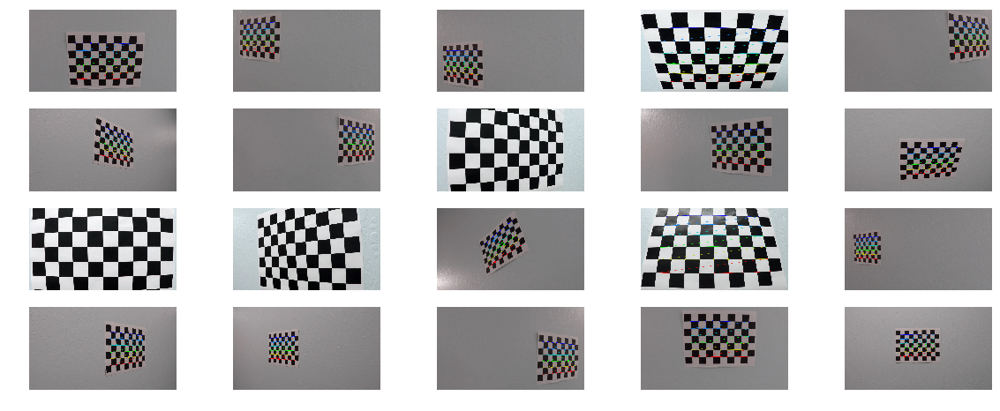

In [2]:
# Show images of camera for calibration
images_folder = 'camera_cal/'
filenames = os.listdir(images_folder)

nx = 9
ny = 6

# Arrays to store object points and image points from all the images.
# setup object points
objp = np.zeros((ny * nx, 3), np.float32)
objp[:, :2] = np.mgrid[0: nx, 0: ny].T.reshape(-1, 2)
image_points = []
object_points = []

fig = plt.figure(figsize = (20, 10))
for i, image in enumerate(filenames):
    file_name = images_folder + image
    img = cv2.imread(file_name)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
    fig.add_subplot(5,5, i + 1)
    # If found, draw corners
    if ret == True:
        # Draw and display the corners
        cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
        object_points.append(objp)
        image_points.append(corners)
        plt.imshow(img)
    else:
        plt.imshow(img)
    plt.axis('off')

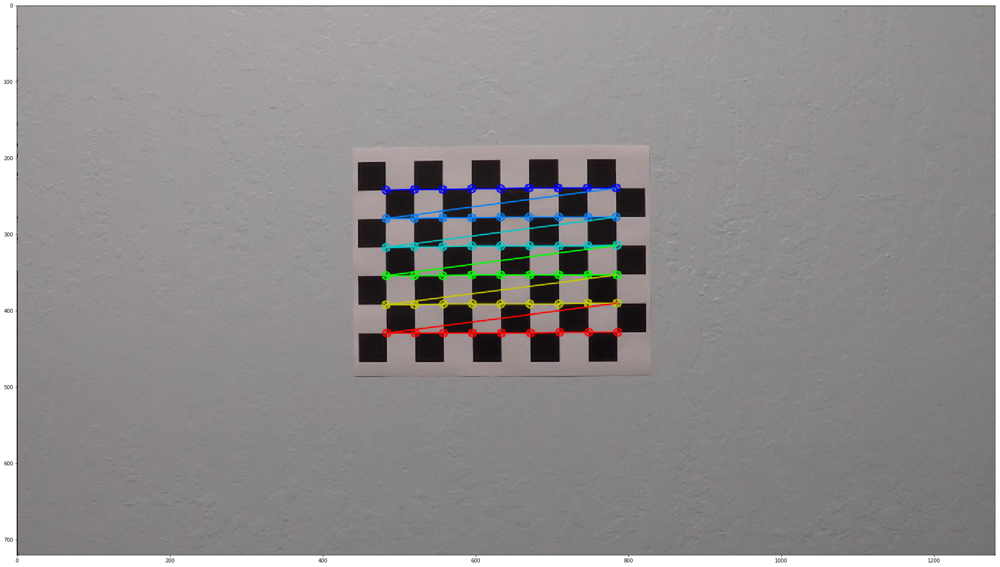

In [3]:
# draw one image with corners to see it better 
fig = plt.figure(figsize = (40, 20))
cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
object_points.append(objp)
image_points.append(corners)
plt.imshow(img)

In [4]:
# perform the calibaration and save calibration data in pickle
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(object_points, image_points, gray.shape[::-1], None, None)

data = [mtx,dist]
pickle.dump( data, open( "camera_calibration.pkl", "wb" ) )

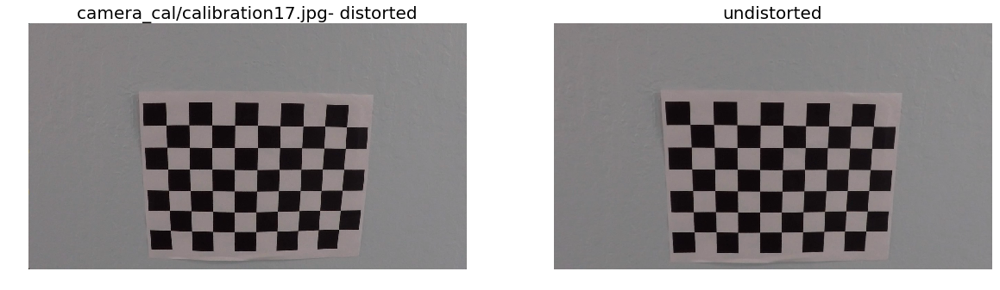

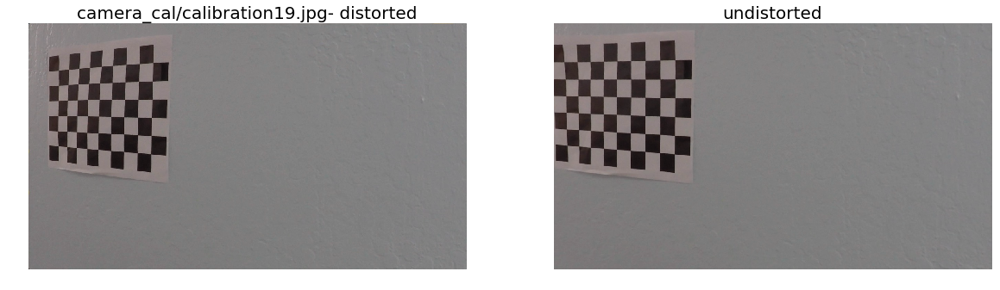

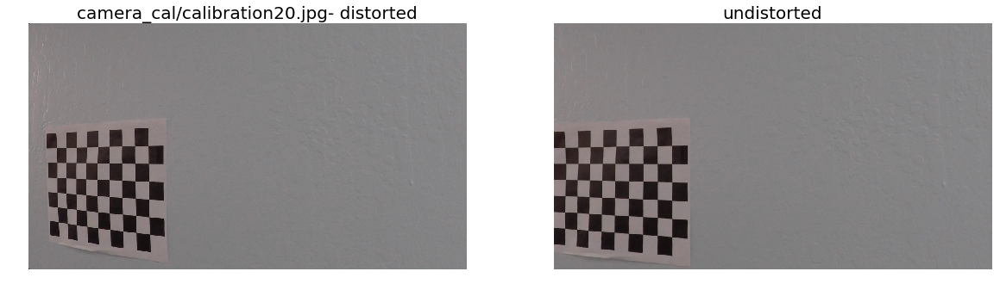

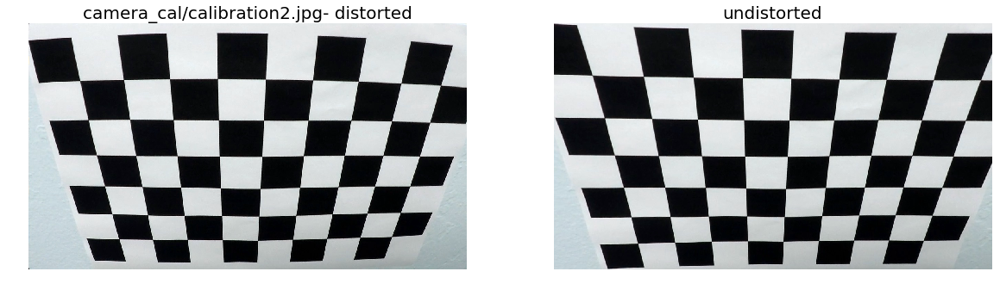

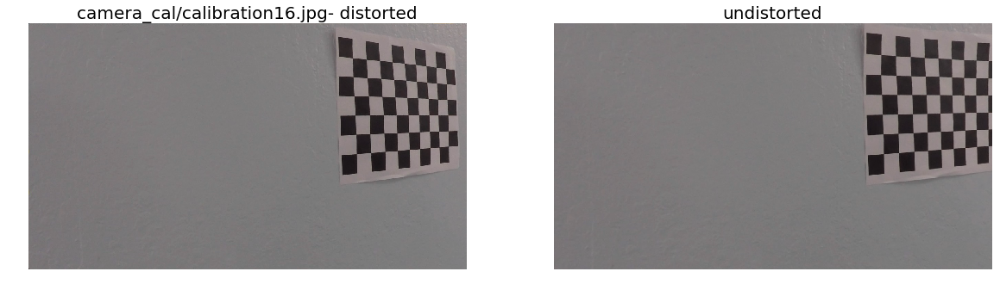

...

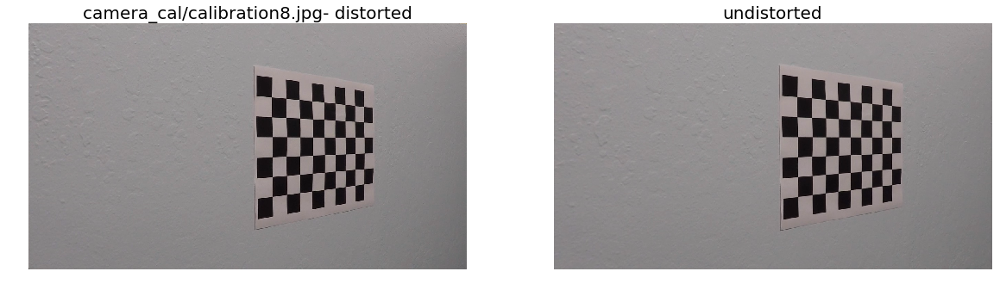

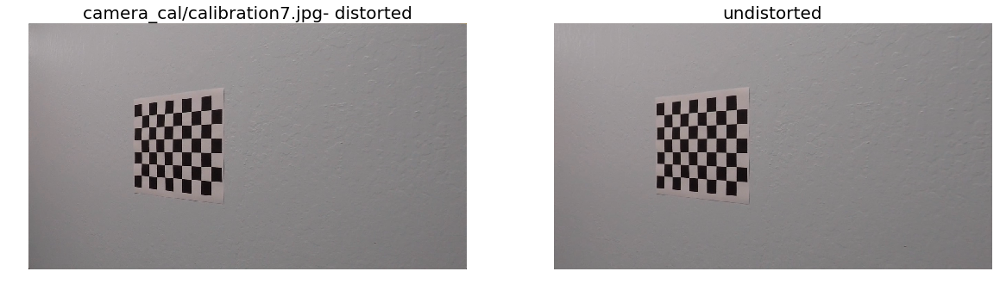

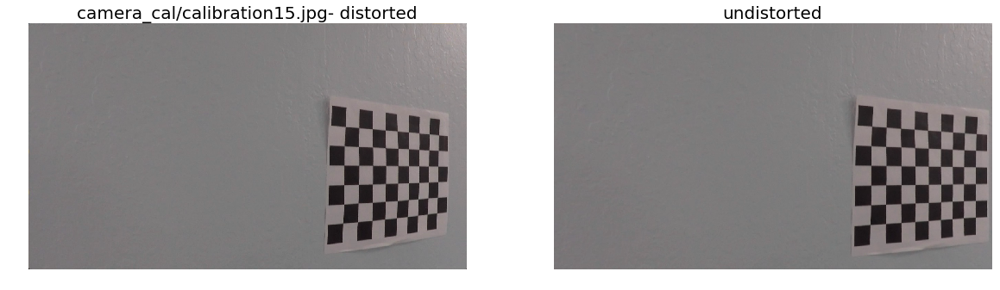

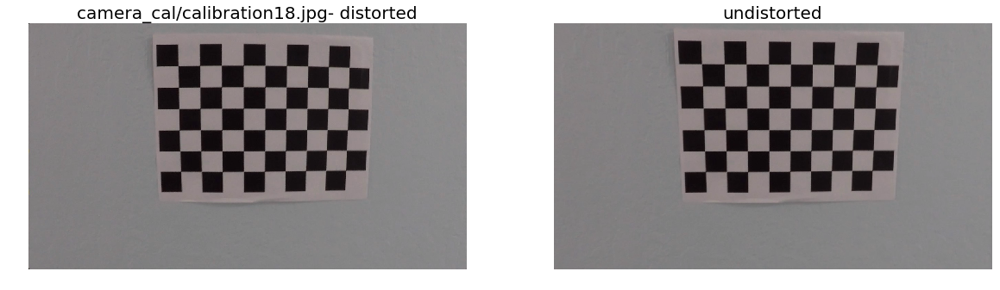

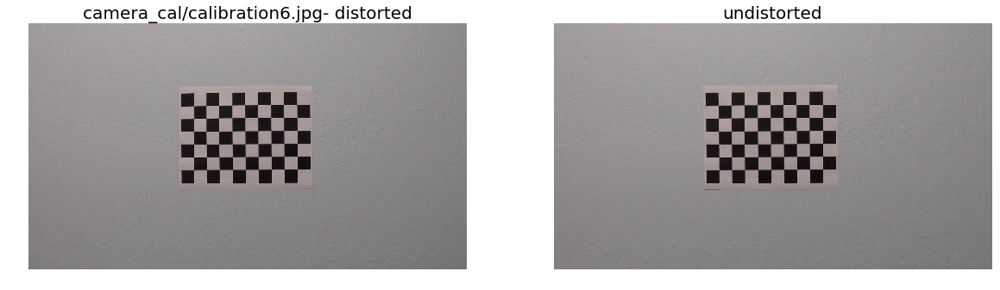

In [6]:
def undistort(img, mtx, dist):
    return cv2.undistort(img, mtx, dist, None, mtx)

for file in filenames:
    file_name = images_folder + file
    img = cv2.imread(file_name)
    undist = undistort(img, mtx, dist)
#     undist = cv2.undistort(img, mtx,dist,None, mtx)
    
    plt.figure(figsize = (20, 10))    
    plt.subplot(1, 2, 1)
    plt.imshow(img)
    plt.title(file_name + '- distorted', fontsize = 20)
    plt.axis('off')
    plt.subplot(1, 2, 2)
    plt.imshow(undist)
    plt.axis('off')
    plt.title('undistorted', fontsize = 20)
    plt.show()

## Perspective transform

When human eyes see near things they look bigger as compare to those who are far away. This is called perspective in a general way. Whereas transformation is the transfer of an object e.t.c from one state to another.

So overall, the perspective transformation deals with the conversion of 3d world into 2d image. The same principle on which human vision works and the same principle on which the camera works.

We will see in detail about why this happens, that those objects which are near to you look bigger, while those who are far away, look smaller even though they look bigger when you reach them.

We will start this discussion by the concept of frame of reference:
Frame of reference:

Frame of reference is basically a set of values in relation to which we measure something.
perspective
5 frames of reference

In order to analyze a 3d world/image/scene, 5 different frame of references are required.

    Object
    World
    Camera
    Image
    Pixel

Object coordinate frame

Object coordinate frame is used for modeling objects. For example, checking if a particular object is in a proper place with respect to the other object. It is a 3d coordinate system.
World coordinate frame

World coordinate frame is used for co-relating objects in a 3 dimensional world. It is a 3d coordinate system.
Camera coordinate frame

Camera co-ordinate frame is used to relate objects with respect of the camera. It is a 3d coordinate system.
Image coordinate frame

It is not a 3d coordinate system, rather it is a 2d system. It is used to describe how 3d points are mapped in a 2d image plane.
Pixel coordinate frame

It is also a 2d coordinate system. Each pixel has a value of pixel co ordinates.
Transformation between these 5 frames
transformation

Thats how a 3d scene is transformed into 2d, with image of pixels.

Now we will explain this concept mathematically.
maths perspective

Where

Y = 3d object

y = 2d Image

f = focal length of the camera

Z = distance between object and the camera

Now there are two different angles formed in this transform which are represented by Q.

The first angle is
tan

Where minus denotes that image is inverted. The second angle that is formed is:
tan1

Comparing these two equations we get
result

From this equation, we can see that when the rays of light reflect back after striking from the object, passed from the camera, an invert image is formed.

We can better understand this, with this example.

For example
Calculating the size of image formed

Suppose an image has been taken of a person 5m tall, and standing at a distance of 50m from the camera, and we have to tell that what is the size of the image of the person, with a camera of focal length is 50mm.
Solution:

Since the focal length is in millimeter, so we have to convert every thing in millimeter in order to calculate it.

So,

Y = 5000 mm.

f = 50 mm.

Z = 50000 mm.

Putting the values in the formula, we get
formula

= -5 mm.

Again, the minus sign indicates that the image is inverted.

In this step I will define a function `birds_eye()` which transforms the undistorted image to a "birds eye view" of the road which focuses only on the lane lines and displays them in such a way that they appear to be relatively parallel to eachother. This will make it easier later on to fit polynomials to the lane lines and measure the curvature.

In [7]:
# Perspeective points from image
# Hard Coded
data = {
    "src": [[240, 720],
            [575, 460],
            [715, 460],
            [1150, 720]],
    "dst": [[440, 720],
            [440, 0],
            [950, 0],
            [950, 720]],
}

test_images/test5.jpg


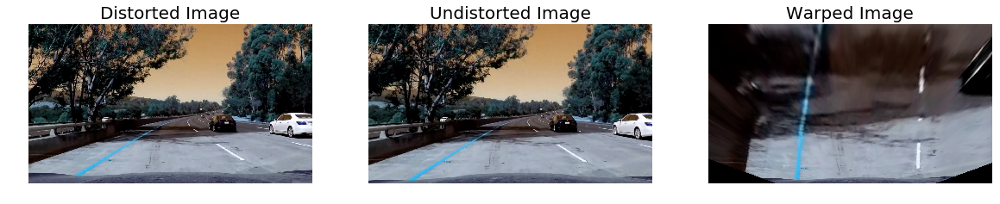

test_images/test1.jpg


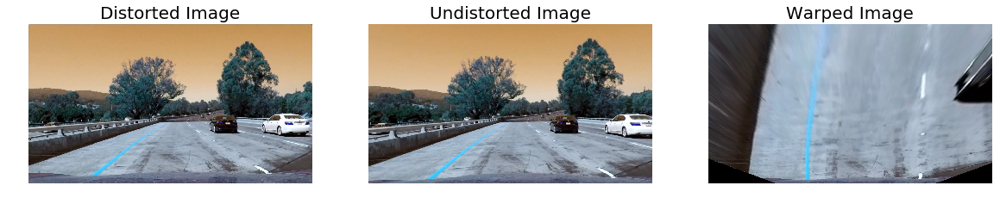

test_images/test2.jpg


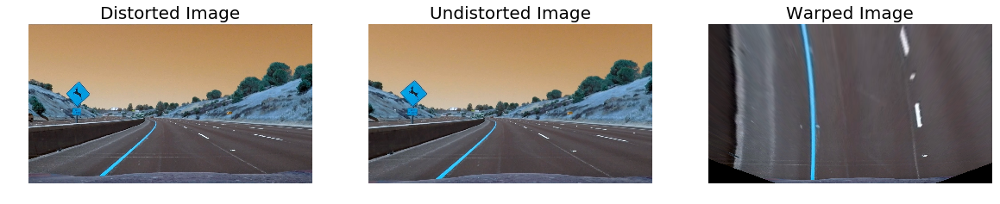

test_images/test6.jpg


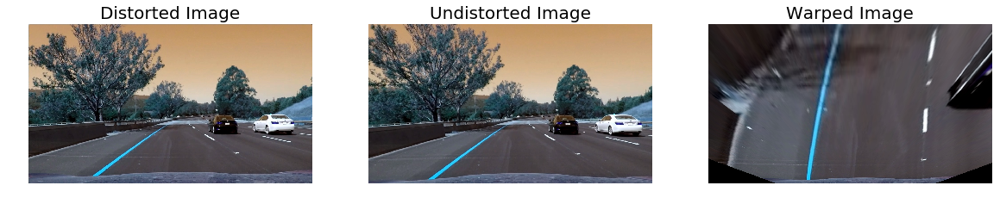

test_images/straight_lines2.jpg


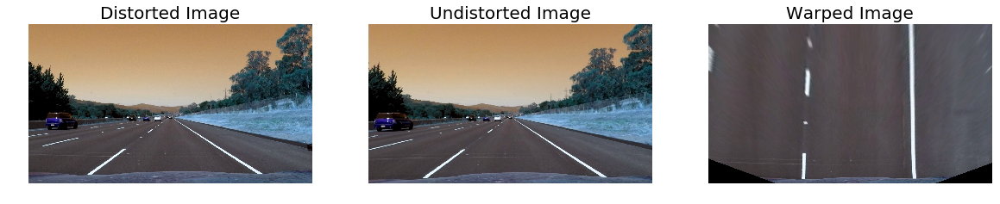

test_images/test3.jpg


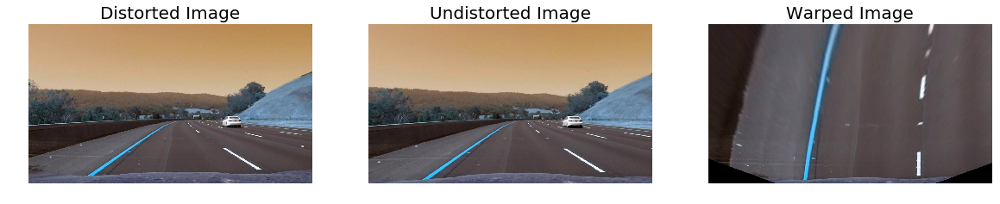

test_images/test4.jpg


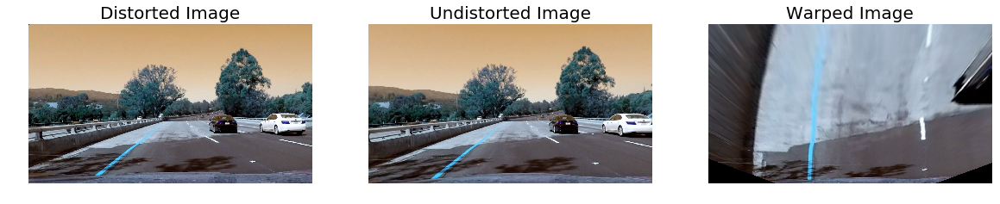

test_images/straight_lines1.jpg


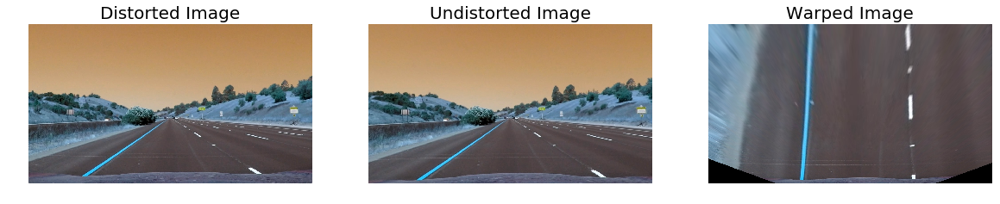

In [8]:
# Creating src and dst points from Perspeective points
src_points = np.float32(data['src'])
dst_points = np.float32(data['dst'])

test_images_folder = 'test_images/'
filenames = os.listdir(test_images_folder)

def perspective_transform(src_points, dst_points):
    M = cv2.getPerspectiveTransform(src_points, dst_points)
    Minv = cv2.getPerspectiveTransform(dst_points, src_points)
    return M, Minv

def warped_images(img, M, img_size, flags = cv2.INTER_LINEAR):
    return cv2.warpPerspective(img, M, img_size, flags = cv2.INTER_LINEAR)

M, minv = perspective_transform(src_points, dst_points)

for file in filenames:
    image_file = test_images_folder + file
    print(image_file)
    img = cv2.imread(image_file)
    img_size = (img.shape[1], img.shape[0])
    undist_images = undistort(img, mtx, dist)
    warped = warped_images(img, M, img_size, flags = cv2.INTER_LINEAR)
    plt.figure(figsize = (20,10))    
    plt.subplot(1, 3, 1)
    plt.imshow(img)
    plt.title('Distorted Image', fontsize = 20)
    plt.axis('off')
    plt.subplot(1, 3, 2)
    plt.imshow(undist_images)
    plt.title('Undistorted Image', fontsize = 20)
    plt.axis('off')
    plt.subplot(1, 3, 3)
    plt.imshow(warped)
    plt.axis('off')
    plt.title('Warped Image', fontsize = 20)
    plt.show()

## Color / Gradient threshold

###  Apply Binary Thresholds

Goal

    In this tutorial, you will learn Simple thresholding, Adaptive thresholding, Otsu's thresholding etc.
    You will learn these functions : cv2.threshold, cv2.adaptiveThreshold etc.

Simple Thresholding

Here, the matter is straight forward. If pixel value is greater than a threshold value, it is assigned one value (may be white), else it is assigned another value (may be black). The function used is cv2.threshold. First argument is the source image, which should be a grayscale image. Second argument is the threshold value which is used to classify the pixel values. Third argument is the maxVal which represents the value to be given if pixel value is more than (sometimes less than) the threshold value. OpenCV provides different styles of thresholding and it is decided by the fourth parameter of the function. Different types are:

    cv2.THRESH_BINARY
    cv2.THRESH_BINARY_INV
    cv2.THRESH_TRUNC
    cv2.THRESH_TOZERO
    cv2.THRESH_TOZERO_INV

- The S Channel from the HLS color space, with a min threshold of 180 and a max threshold of 255, did a fairly good job of identifying both the white and yellow lane lines, but did not pick up 100% of the pixels in either one, and had a tendency to get distracted by shadows on the road.
- The L Channel from the LUV color space, with a min threshold of 225 and a max threshold of 255, did an almost perfect job of picking up the white lane lines, but completely ignored the yellow lines.
- The B channel from the Lab color space, with a min threshold of 155 and an upper threshold of 200, did a better job than the S channel in identifying the yellow lines, but completely ignored the white lines. 

I chose to create a combined binary threshold based on the three above mentioned binary thresholds, to create one combination thresholded image which does a great job of highlighting almost all of the white and yellow lane lines.

**Note: The S binary threshold was left out of the final combined binary image and was not used in detecting lane lines because it added extra noise to the binary image and interfered with detecting lane lines accurately.**

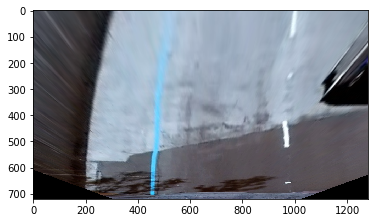

In [10]:
# 8
# test image
test_image1 = 'test_images/test4.jpg'
img_test_image1 = cv2.imread(test_image1)
warped_test_image1 = warped_images(img_test_image1, M, img_size, flags=cv2.INTER_LINEAR)
plt.imshow(warped_test_image1)

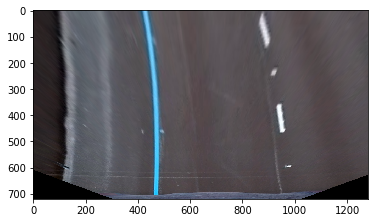

In [11]:
test_image2 = 'test_images/test2.jpg'
img_test_image2 = cv2.imread(test_image2)
warped_test_image2 = warped_images(img_test_image2, M, img_size, flags=cv2.INTER_LINEAR)
plt.imshow(warped_test_image2)

In [12]:
def color_mask(hsv,low,high):
    # Return mask from HSV 
    mask = cv2.inRange(hsv, low, high)
    return mask

def apply_color_mask(hsv,img,low,high):
    # Apply color mask to image
    mask = cv2.inRange(hsv, low, high)
    res = cv2.bitwise_and(img,img, mask= mask)
    return res

(-0.5, 1279.5, 719.5, -0.5)

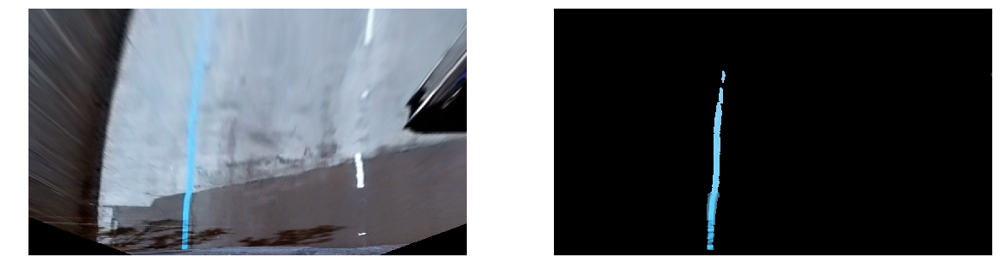

In [13]:
image_HSV1 = cv2.cvtColor(warped_test_image1,cv2.COLOR_RGB2HSV)

yellow_hsv_low  = np.array([ 0,  100,  100])
yellow_hsv_high = np.array([ 255, 255, 255])

res_mask = color_mask(image_HSV1, yellow_hsv_low, yellow_hsv_high)
res = apply_color_mask(image_HSV1, warped_test_image1, yellow_hsv_low, yellow_hsv_high)

plt.figure(figsize = (20, 10))
plt.subplot(1, 2, 1)
plt.imshow(warped_test_image1)
plt.axis('off')
plt.subplot(1, 2, 2)
plt.imshow(res)
plt.axis('off')

(-0.5, 1279.5, 719.5, -0.5)

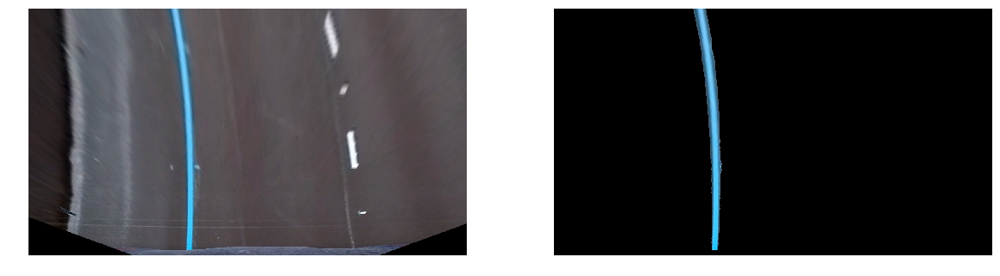

In [14]:
#12
image_HSV2 = cv2.cvtColor(warped_test_image2,cv2.COLOR_RGB2HSV)

yellow_hsv_low  = np.array([ 0,  100,  100])
yellow_hsv_high = np.array([ 255, 255, 255])

res_mask = color_mask(image_HSV2, yellow_hsv_low, yellow_hsv_high)
res = apply_color_mask(image_HSV2, warped_test_image2, yellow_hsv_low, yellow_hsv_high)

plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
plt.imshow(warped_test_image2)
plt.axis('off')
plt.subplot(1,2,2)
plt.imshow(res)
plt.axis('off')

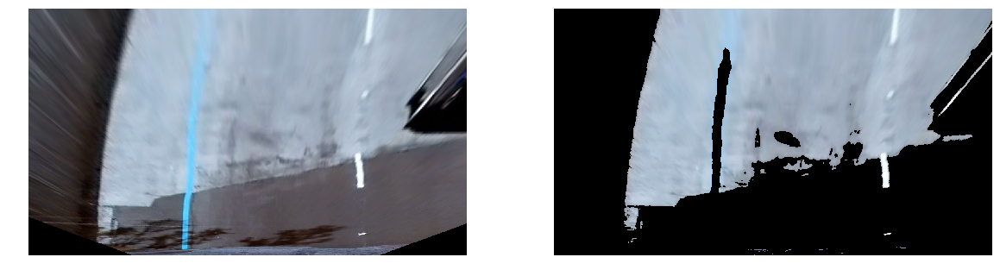

In [15]:
image_HSV1 = cv2.cvtColor(warped_test_image1,cv2.COLOR_RGB2HSV)

white_hsv_low  = np.array([ 0,   0,   160])
white_hsv_high = np.array([ 255,  80, 255])

res_apply = apply_color_mask(image_HSV1,warped_test_image1,white_hsv_low,white_hsv_high)

plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
plt.imshow(warped_test_image1)
plt.axis('off')
plt.subplot(1,2,2)
plt.imshow(res_apply)
plt.axis('off');

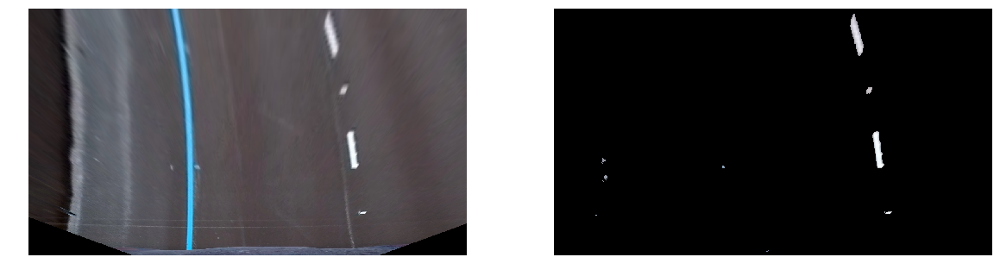

In [16]:
image_HSV2 = cv2.cvtColor(warped_test_image2,cv2.COLOR_RGB2HSV)

white_hsv_low  = np.array([ 0,   0,   160])
white_hsv_high = np.array([ 255,  80, 255])

res_apply = apply_color_mask(image_HSV2,warped_test_image2,white_hsv_low,white_hsv_high)

plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
plt.imshow(warped_test_image2)
plt.axis('off')
plt.subplot(1,2,2)
plt.imshow(res_apply)
plt.axis('off');

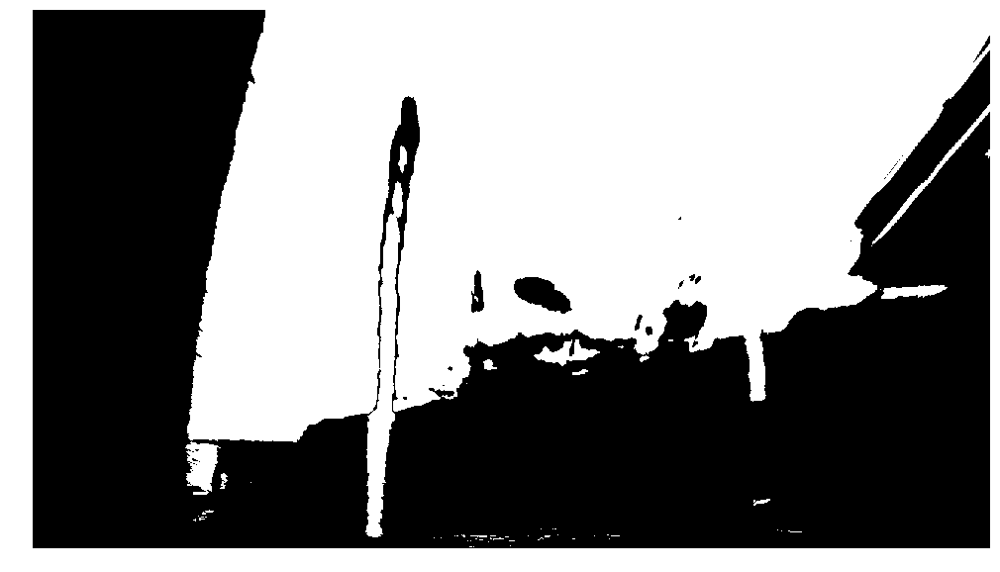

In [17]:
# 15
# combined lane mask

mask_yellow = color_mask(image_HSV1,yellow_hsv_low,yellow_hsv_high)
mask_white = color_mask(image_HSV1,white_hsv_low,white_hsv_high)
mask_lane = cv2.bitwise_or(mask_yellow,mask_white)

plt.figure(figsize=(20,10))
plt.imshow(mask_lane,cmap='gray')
plt.axis('off');

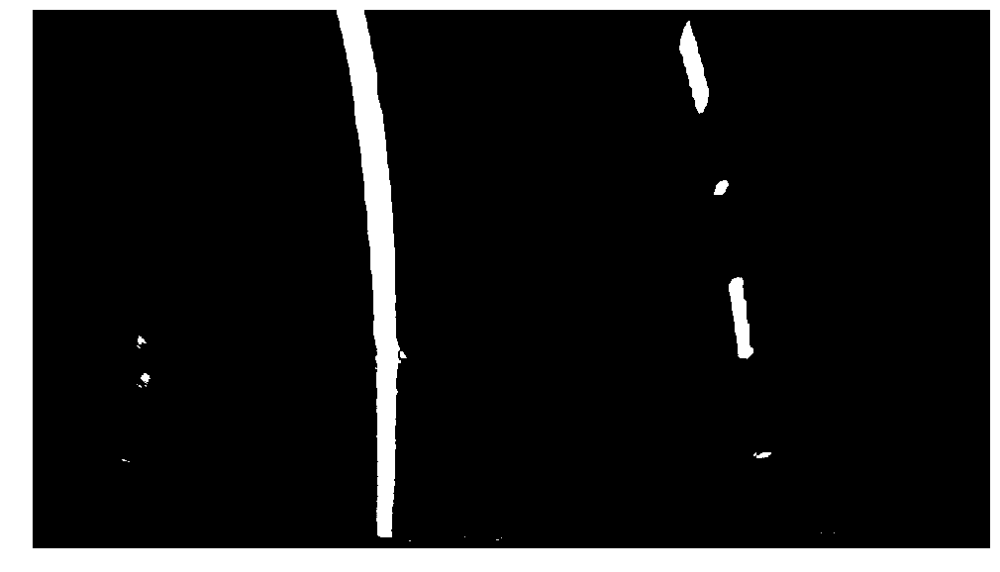

In [18]:
# 16
# combined lane mask

mask_yellow = color_mask(image_HSV2,yellow_hsv_low,yellow_hsv_high)
mask_white = color_mask(image_HSV2,white_hsv_low,white_hsv_high)
mask_lane = cv2.bitwise_or(mask_yellow,mask_white)

plt.figure(figsize=(20,10))
plt.imshow(mask_lane,cmap='gray')
plt.axis('off');

<function __main__.update>

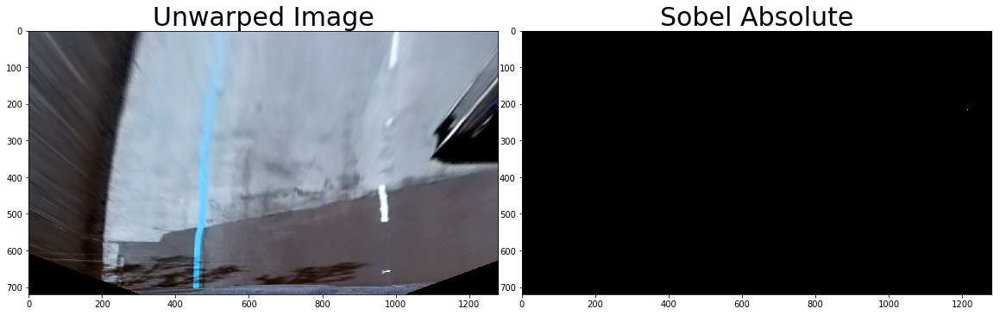

In [19]:
def abs_sobel_thresh_test(img, orient='x', thresh_min=25, thresh_max=255):
    # Apply the following steps to img
    # 1) Convert to grayscale === or LAB L channel
    gray = (cv2.cvtColor(img, cv2.COLOR_RGB2LAB))[:,:,0]
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    sobel = cv2.Sobel(gray, cv2.CV_64F, orient=='x', orient=='y')
    # 3) Take the absolute value of the derivative or gradient
    abs_sobel = np.absolute(sobel)
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    # 6) Return this mask as your binary_output image
    binary_output = sxbinary # Remove this line
    return binary_output

def update(min_thresh, max_thresh):
    sobel_abs = abs_sobel_thresh_test(warped_test_image1, 'x', min_thresh, max_thresh)
    # Visualize sobel absolute threshold
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    f.subplots_adjust(hspace = .2, wspace=.05)
    ax1.imshow(warped_test_image1)
    ax1.set_title('Unwarped Image', fontsize=30)
    ax2.imshow(sobel_abs, cmap='gray')
    ax2.set_title('Sobel Absolute', fontsize=30)

interact(update, min_thresh=(0,255), max_thresh=(0,255))

# 32, 35

<function __main__.update>

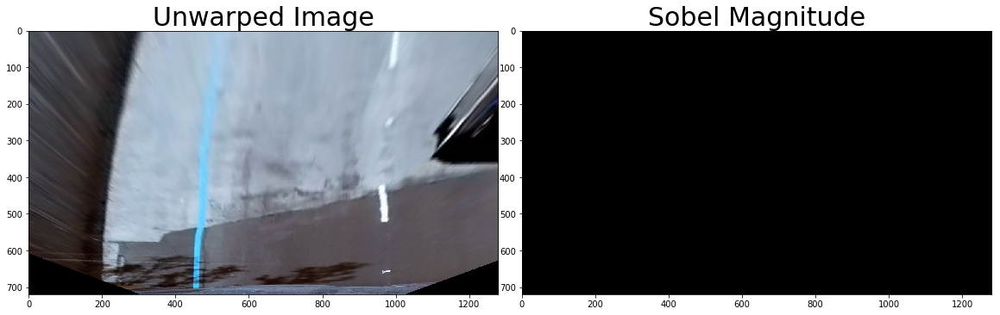

In [20]:
# Define a function that applies Sobel x and y, 
# then computes the magnitude of the gradient
# and applies a threshold
def mag_threshold(img, sobel_kernel=25, mag_thresh=(25, 255)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    # 3) Calculate the magnitude 
    mag_sobel = np.sqrt(np.square(sobelx) + np.square(sobely))
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scaled_sobel = np.uint8(255*mag_sobel/np.max(mag_sobel))
    # 5) Create a binary mask where mag thresholds are met
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= mag_thresh[0]) & (scaled_sobel <= mag_thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    binary_output = np.copy(sxbinary) 
    return binary_output

def update(kernel_size, min_thresh, max_thresh):
    sobel_mag = mag_threshold(warped_test_image1, kernel_size, (min_thresh, max_thresh))
    # Visualize sobel magnitude threshold
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    f.subplots_adjust(hspace = .2, wspace=.05)
    ax1.imshow(warped_test_image1)
    ax1.set_title('Unwarped Image', fontsize=30)
    ax2.imshow(sobel_mag, cmap='gray')
    ax2.set_title('Sobel Magnitude', fontsize=30)

interact(update, kernel_size=(1,31,2), 
                 min_thresh=(0,255), 
                 max_thresh=(0,255))

# 17, 19, 167

<function __main__.update>

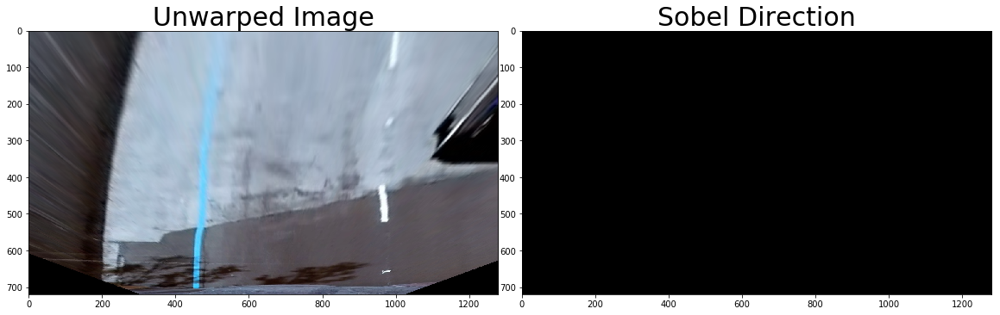

In [21]:
# Define a function that applies Sobel x and y, 
# then computes the direction of the gradient
# and applies a threshold.
def dir_threshold(img, sobel_kernel=7, thresh=(0, 0.09)):    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Take the absolute value of the x and y gradients
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    grad_dir = np.arctan2(abs_sobely, abs_sobelx)
    # 5) Create a binary mask where direction thresholds are met
    binary_output =  np.zeros_like(grad_dir)
    binary_output[(grad_dir >= thresh[0]) & (grad_dir <= thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    return binary_output

def update(kernel_size, min_thresh, max_thresh):
    sobel_dir = dir_threshold(warped_test_image1, kernel_size, (min_thresh, max_thresh))
    # Visualize sobel direction threshold
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    f.subplots_adjust(hspace = .2, wspace=.05)
    ax1.imshow(warped_test_image1)
    ax1.set_title('Unwarped Image', fontsize=30)
    ax2.imshow(sobel_dir, cmap='gray')
    ax2.set_title('Sobel Direction', fontsize=30)

interact(update, kernel_size=(1,31,2), 
                 min_thresh=(0,np.pi/2,0.01), 
                 max_thresh=(0,np.pi/2,0.01))

# 1, 0.02, 0.30

<function __main__.update>

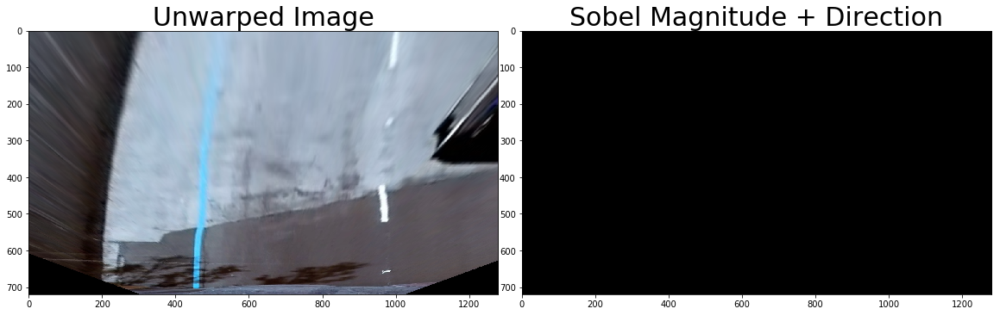

In [22]:
def update(mag_kernel_size, mag_min_thresh, mag_max_thresh, dir_kernel_size, dir_min_thresh, dir_max_thresh):
    sobelMag2 = mag_threshold(warped_test_image1, mag_kernel_size, (mag_min_thresh, mag_max_thresh))
    sobelDir2 = dir_threshold(warped_test_image1, dir_kernel_size, (dir_min_thresh, dir_max_thresh))
    combined = np.zeros_like(sobelMag2)
    combined[((sobelMag2 == 1) & (sobelDir2 == 1))] = 1
    # Visualize sobel magnitude + direction threshold
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    f.subplots_adjust(hspace = .2, wspace=.05)
    ax1.imshow(warped_test_image1)
    ax1.set_title('Unwarped Image', fontsize=30)
    ax2.imshow(combined, cmap='gray')
    ax2.set_title('Sobel Magnitude + Direction', fontsize=30)

interact(update, mag_kernel_size=(1,31,2), 
                 mag_min_thresh=(0,255), 
                 mag_max_thresh=(0,255),
                 dir_kernel_size=(1,31,2), 
                 dir_min_thresh=(0,np.pi/2,0.01), 
                 dir_max_thresh=(0,np.pi/2,0.01))

# 15, 25, 132,15 , 0, 0.63

In [23]:
# 21

def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
    # Calculate directional gradient
    # Apply threshold
    if orient=='x':
        img_s = cv2.Sobel(img,cv2.CV_64F, 1, 0)
    else:
        img_s = cv2.Sobel(img,cv2.CV_64F, 0, 1)
    img_abs = np.absolute(img_s)
    img_sobel = np.uint8(255*img_abs/np.max(img_abs))
    
    binary_output = 0*img_sobel
    binary_output[(img_sobel >= thresh[0]) & (img_sobel <= thresh[1])] = 1
    return binary_output

def gaussian_blur(img, kernel=5):
    # Function to smooth image
    blur = cv2.GaussianBlur(img,(kernel,kernel),0)
    return blur

In [24]:
# 22
# Image processing pipeline

def pipeline(image):
    # Undistordt
    image_undistordt = undistort(image, mtx, dist)
    image_undistordt = gaussian_blur(image, kernel=5)
    
    # Perspective transfrom
    M, Minv = perspective_transform(src_points, dst_points)
    warped = warped_images(image_undistordt, M, img_size, flags=cv2.INTER_LINEAR)
    
    # HSV
    image_HSV = cv2.cvtColor(warped,cv2.COLOR_RGB2HSV)
    
    # Color 
    yellow_hsv_low  = np.array([ 0,  100,  100])
    yellow_hsv_high = np.array([ 255, 255, 255])
    
    white_hsv_low  = np.array([ 20,   0, 180])
    white_hsv_high = np.array([ 200,  30, 255])

    # get yellow and white masks 
    mask_yellow = color_mask(image_HSV,yellow_hsv_low,yellow_hsv_high)
    mask_white = color_mask(image_HSV,white_hsv_low,white_hsv_high)
    
    # Combine white and yellow masks into 1
    mask_lane = cv2.bitwise_or(mask_yellow,mask_white)   
  
    # Convert image to HLS scheme
    image_HLS = cv2.cvtColor(warped,cv2.COLOR_RGB2HLS)
    
    # Apply sobel filters on L and S channels.
    img_gs = image_HLS[:,:,1]
    img_abs_x = abs_sobel_thresh(img_gs,'x',5,(50,225))
    img_abs_y = abs_sobel_thresh(img_gs,'y',5,(50,225))
    wraped2 = np.copy(cv2.bitwise_or(img_abs_x,img_abs_y))
    
    img_gs = image_HLS[:,:,2]
    img_abs_x = abs_sobel_thresh(img_gs,'x',5,(50,255))
    img_abs_y = abs_sobel_thresh(img_gs,'y',5,(50,255))
    wraped3 = np.copy(cv2.bitwise_or(img_abs_x,img_abs_y))
    
    # Combine sobel filter information from L and S channels.
    image_cmb = cv2.bitwise_or(wraped2,wraped3)
    image_cmb = gaussian_blur(image_cmb,25)
    
    # Combine masks from sobel and color masks.

    image_cmb1 = np.zeros_like(image_cmb)
    image_cmb1[(mask_lane>=1)|(image_cmb>=1)]=1   
        
    return image_cmb1, Minv

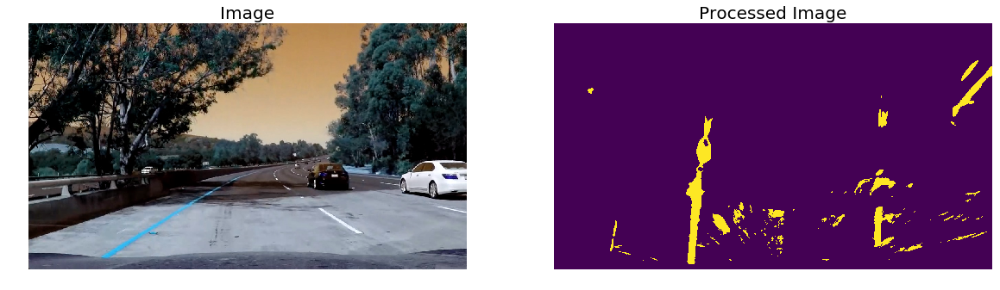

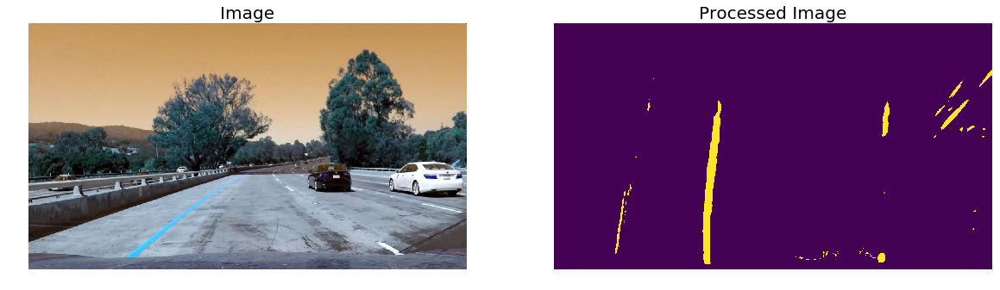

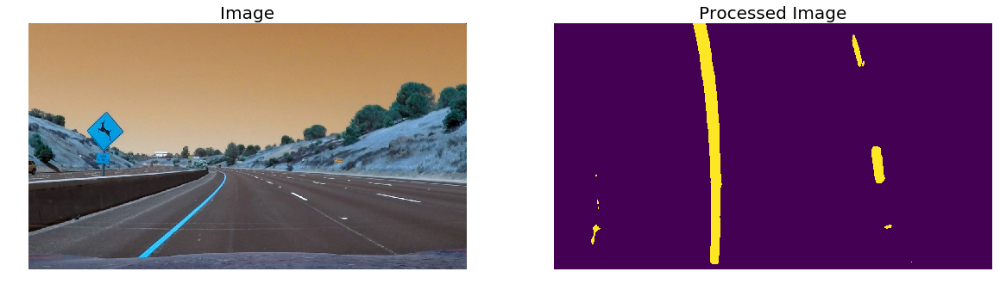

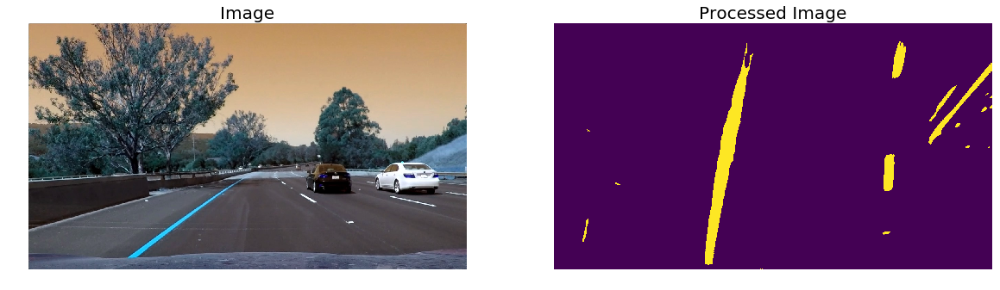

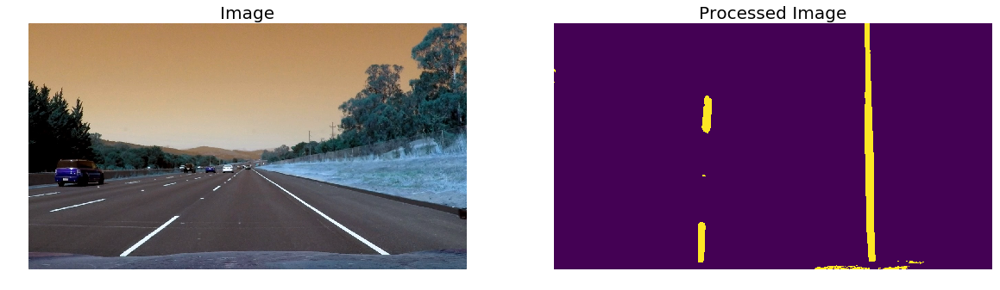

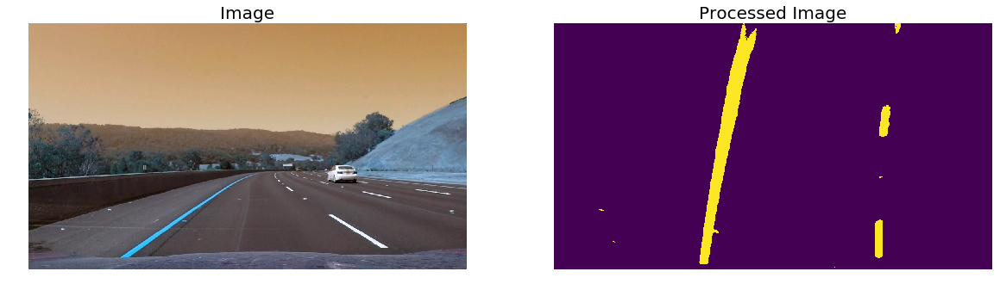

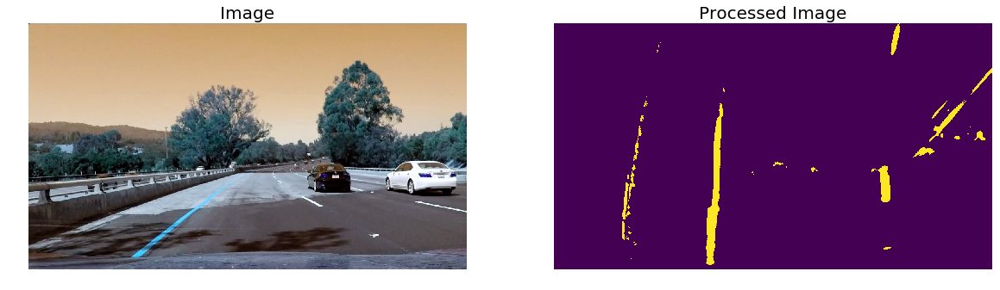

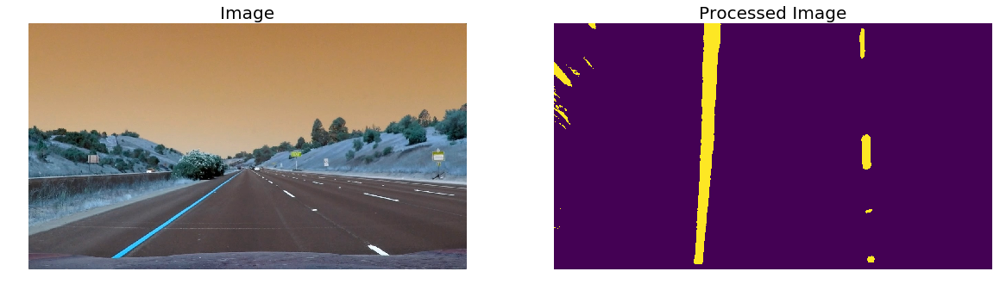

In [25]:
test_images_folder = 'test_images/'
filenames = os.listdir(test_images_folder)

for file in filenames:
    image_file = test_images_folder + file
    img = cv2.imread(image_file)
    processed_image, Minv = pipeline(img)
    
    plt.figure(figsize=(20,10))    
    plt.subplot(1,2,1)
    plt.imshow(img)
    plt.title('Image', fontsize=20)
    plt.axis('off')
    plt.subplot(1,2,2)
    plt.imshow(processed_image)
    plt.title('Processed Image', fontsize=20)
    plt.axis('off')

# Detect lane lines
### Fitting a polynomial to the lane lines, calculating vehicle position and radius of curvature:

In statistics, polynomial regression is a form of regression analysis in which the relationship between the independent variable x and the dependent variable y is modelled as an nth degree polynomial in x. Polynomial regression fits a nonlinear relationship between the value of x and the corresponding conditional mean of y, denoted E(y |x), and has been used to describe nonlinear phenomena such as the growth rate of tissues,[1] the distribution of carbon isotopes in lake sediments,[2] and the progression of disease epidemics.[3] Although polynomial regression fits a nonlinear model to the data, as a statistical estimation problem it is linear, in the sense that the regression function E(y | x) is linear in the unknown parameters that are estimated from the data. For this reason, polynomial regression is considered to be a special case of multiple linear regression.

The predictors resulting from the polynomial expansion of the "baseline" predictors are known as interaction features. Such predictors/features are also used in classification settings.

Previously we approximated each lane boundary as a second order polynomial curve, which can be represented with the following equation.

Therefore, given x and y variables contain coordinates of points making up the curve, we can get curvature radius as follows.

At this point I was able to use the combined binary image to isolate lane line pixels and fit a polynomial to each of the lane lines. The space in between the identified lane lines is filled in to highlight the driveable area in the lane. The position of the vehicle was measured by taking the average of the x intercepts of each line.

The equation for calculating radius of curvature was discovered at this page: http://www.intmath.com/applications-differentiation/8-radius-curvature.php

In the function `fill_lane()` below, lane lines are detected by identifying peaks in a histogram of the image and detecting nonzero pixels in close proximity to the peaks. 


In [26]:
# 24
# Define method to fit polynomial to binary image with lines extracted, using sliding window

def sliding_window(img):
    
    # Take a histogram of the bottom half of the image
    histogram = np.sum(img[img.shape[0]//2:,:], axis=0)
    
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    quarter_point = np.int(midpoint//2)
   
    # Previously the left/right base was the max of the left/right half of the histogram
    # this changes it so that only a quarter of the histogram (directly to the left/right) is considered
    leftx_base = np.argmax(histogram[quarter_point:midpoint]) + quarter_point
    rightx_base = np.argmax(histogram[midpoint:(midpoint+quarter_point)]) + midpoint
    
    # Choose the number of sliding windows
    nwindows = 9
    
    # Set height of windows
    window_height = np.int(img.shape[0]/nwindows)
   
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    
    # Set the width of the windows +/- margin
    margin = 85
    
    # Set minimum number of pixels found to recenter window
    minpix = 50
    
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    
    # Rectangle data for visualization
    rectangle_data = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = img.shape[0] - (window+1)*window_height
        win_y_high = img.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        rectangle_data.append((win_y_low, win_y_high, win_xleft_low, win_xleft_high, win_xright_low, win_xright_high))
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    left_fit, right_fit = (None, None)
    # Fit a second order polynomial to each
    if len(leftx) != 0:
        left_fit = np.polyfit(lefty, leftx, 2)
    if len(rightx) != 0:
        right_fit = np.polyfit(righty, rightx, 2)
    
    visualization_data = (rectangle_data, histogram)
    
    return left_fit, right_fit, left_lane_inds, right_lane_inds, visualization_data

In [27]:
# 25
# Define method to fit polynomial to binary image with lines extracted, using sliding window
def polyfit_with_prev_fit(binary_warped, left_fit_prev, right_fit_prev):
    
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 80
    left_lane_inds = ((nonzerox > (left_fit_prev[0]*(nonzeroy**2) + left_fit_prev[1]*nonzeroy + left_fit_prev[2] - margin)) & 
                      (nonzerox < (left_fit_prev[0]*(nonzeroy**2) + left_fit_prev[1]*nonzeroy + left_fit_prev[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit_prev[0]*(nonzeroy**2) + right_fit_prev[1]*nonzeroy + right_fit_prev[2] - margin)) & 
                       (nonzerox < (right_fit_prev[0]*(nonzeroy**2) + right_fit_prev[1]*nonzeroy + right_fit_prev[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    left_fit_new, right_fit_new = (None, None)
    if len(leftx) != 0:
        # Fit a second order polynomial to each
        left_fit_new = np.polyfit(lefty, leftx, 2)
    if len(rightx) != 0:
        right_fit_new = np.polyfit(righty, rightx, 2)
    return left_fit_new, right_fit_new, left_lane_inds, right_lane_inds

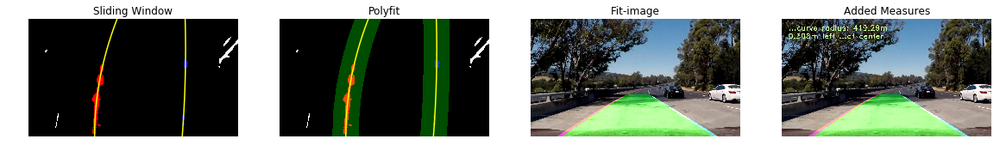

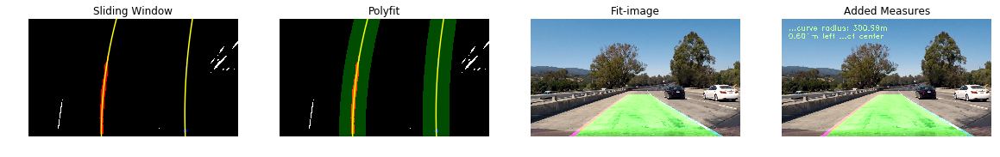

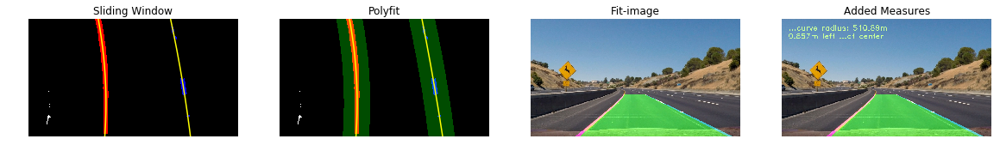

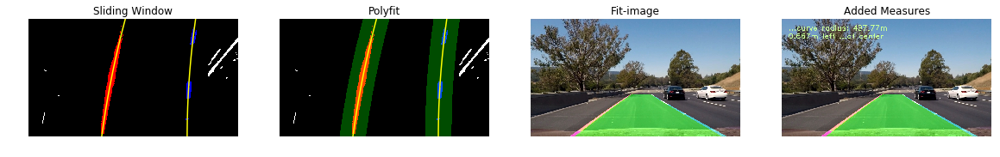

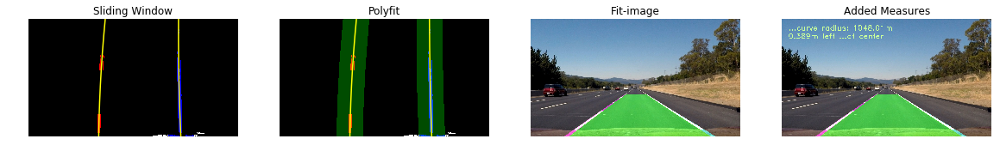

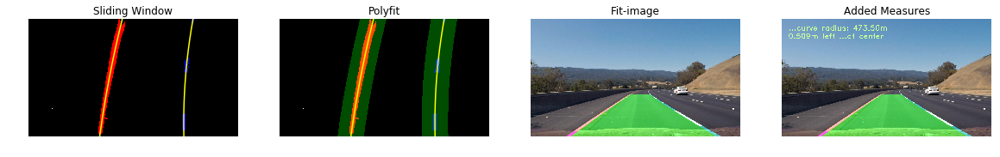

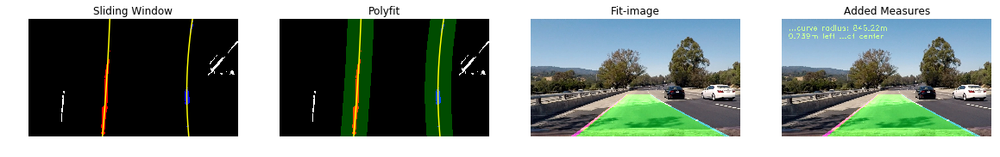

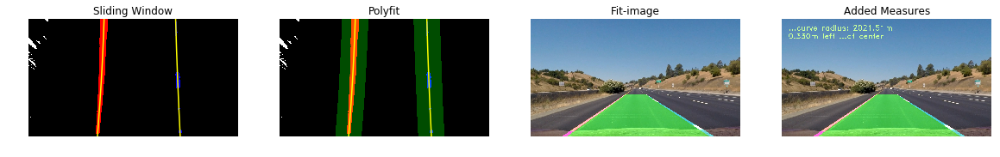

In [28]:
# Compute the radius of curvature of the fit.
# Radius of Curvature and Distance from Lane Center Calculation

def measuring_curvature(bin_img, l_fit, r_fit, l_lane_inds, r_lane_inds):
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 3.048/100 # meters per pixel in y dimension, lane line is 10 ft = 3.048 meters
    xm_per_pix = 3.7/378 # meters per pixel in x dimension, lane width is 12 ft = 3.7 meters
    left_curverad, right_curverad, center_dist = (0, 0, 0)
    # Define y-value where we want radius of curvature
    # I'll choose the maximum y-value, corresponding to the bottom of the image
    h = bin_img.shape[0]
    ploty = np.linspace(0, h-1, h)
    y_eval = np.max(ploty)
  
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = bin_img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Again, extract left and right line pixel positions
    leftx = nonzerox[l_lane_inds]
    lefty = nonzeroy[l_lane_inds] 
    rightx = nonzerox[r_lane_inds]
    righty = nonzeroy[r_lane_inds]
    
    if len(leftx) != 0 and len(rightx) != 0:
        # Fit new polynomials to x,y in world space
        left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
        right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
        # Calculate the new radii of curvature
        left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
        right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
        # Now our radius of curvature is in meters
    
    # Distance from center is image x midpoint - mean of l_fit and r_fit intercepts 
    if r_fit is not None and l_fit is not None:
        car_position = bin_img.shape[1]/2
        l_fit_x_int = l_fit[0]*h**2 + l_fit[1]*h + l_fit[2]
        r_fit_x_int = r_fit[0]*h**2 + r_fit[1]*h + r_fit[2]
        lane_center_position = (r_fit_x_int + l_fit_x_int) /2
        center_dist = (car_position - lane_center_position) * xm_per_pix
    return left_curverad, right_curverad, center_dist


def draw_lane(original_img, binary_img, l_fit, r_fit, Minv):
    # Draw Lines on images
    new_img = np.copy(original_img)
    if l_fit is None or r_fit is None:
        return original_img
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_img).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    h,w = binary_img.shape
    ploty = np.linspace(0, h-1, num=h)# to cover same y-range as image
    left_fitx = l_fit[0]*ploty**2 + l_fit[1]*ploty + l_fit[2]
    right_fitx = r_fit[0]*ploty**2 + r_fit[1]*ploty + r_fit[2]

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    cv2.polylines(color_warp, np.int32([pts_left]), isClosed=False, color=(255,0,255), thickness=15)
    cv2.polylines(color_warp, np.int32([pts_right]), isClosed=False, color=(0,255,255), thickness=15)

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (w, h)) 
    # Combine the result with the original image
    result = cv2.addWeighted(new_img, 1, newwarp, 0.5, 0)
    return result

def add_data(original_img, curv_rad, center_dist):
    # add measurement data on iamges 
    new_img = np.copy(original_img)
    h = new_img.shape[0]
    font = cv2.FONT_HERSHEY_DUPLEX
    text = '...curve radius: ' + '{:04.2f}'.format(curv_rad) + 'm'
    cv2.putText(new_img, text, (40,70), font, 1.5, (200,255,155), 2)
    direction = ''
    if center_dist > 0:
        direction = 'right'
    elif center_dist < 0:
        direction = 'left'
    abs_center_dist = abs(center_dist)
    text = '{:04.3f}'.format(abs_center_dist) + 'm ' + direction + ' ...of center'
    cv2.putText(new_img, text, (40,120), font, 1.5, (200,255,155), 2)
    return new_img

margin = 80

# test_images_folder = 'test_images/'
# filenames = os.listdir(test_images_folder)
for file in filenames:
    image_file = test_images_folder + file

#     image_file = 'test_images/test6.jpg'
    image_example = cv2.imread(image_file)
    image_example = cv2.cvtColor(image_example, cv2.COLOR_BGR2RGB)
    image_example_bin, Minv = pipeline(image_example)

    # Visualize sliding window polyfit 
    left_fit, right_fit, left_lane_inds, right_lane_inds, visualization_data = sliding_window(image_example_bin)

    h = image_example.shape[0]
    left_fit_x_int = left_fit[0]*h**2 + left_fit[1]*h + left_fit[2]
    right_fit_x_int = right_fit[0]*h**2 + right_fit[1]*h + right_fit[2]

    rectangles = visualization_data[0]
    histogram = visualization_data[1]

    # Create an output image to draw on and  visualize the result
    out_img = np.uint8(np.dstack((image_example_bin, image_example_bin, image_example_bin))*255)

    # Generate x and y values for plotting
    ploty = np.linspace(0, image_example_bin.shape[0]-1, image_example_bin.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    for rect in rectangles:

        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(rect[2],rect[0]),(rect[3],rect[1]),(0,255,0), 2) 
        cv2.rectangle(out_img,(rect[4],rect[0]),(rect[5],rect[1]),(0,255,0), 2) 

    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = image_example_bin.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [100, 200, 255]

    # Polyfit Using Fit from Previous Frame
    left_fit2, right_fit2, left_lane_inds2, right_lane_inds2 = polyfit_with_prev_fit(image_example_bin, left_fit, right_fit)

    # Generate x and y values for plotting
    ploty = np.linspace(0, image_example_bin.shape[0]-1, image_example_bin.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    left_fitx2 = left_fit2[0]*ploty**2 + left_fit2[1]*ploty + left_fit2[2]
    right_fitx2 = right_fit2[0]*ploty**2 + right_fit2[1]*ploty + right_fit2[2]

    # Create an image to draw on and an image to show the selection window
    out_img = np.uint8(np.dstack((image_example_bin, image_example_bin, image_example_bin))*255)
    window_img = np.zeros_like(out_img)

    # Color in left and right line pixels
    nonzero = image_example_bin.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    out_img[nonzeroy[left_lane_inds2], nonzerox[left_lane_inds2]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds2], nonzerox[right_lane_inds2]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area (OLD FIT)
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)

    # Draw detected lane onto example image 

    exampleImg_out1 = draw_lane(image_example, image_example_bin, left_fit, right_fit, Minv)

    # Calculate measurements
    rad_l, rad_r, d_center = measuring_curvature(image_example_bin, left_fit, right_fit, left_lane_inds, right_lane_inds)

    # Add measurement data 
    exampleImg_out2 = add_data(exampleImg_out1, (rad_l+rad_r)/2, d_center)

    plt.figure(figsize=(20,10))    
    plt.subplot(1,4,1)
    plt.imshow(out_img)
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    plt.title('Sliding Window')
    plt.axis('off')
    plt.subplot(1,4,2)
    plt.imshow(result)
    plt.plot(left_fitx2, ploty, color='yellow')
    plt.plot(right_fitx2, ploty, color='yellow')
    plt.title('Polyfit')
    plt.axis('off')
    plt.subplot(1,4,3)
    plt.imshow(exampleImg_out1)
    plt.title('Fit-image')
    plt.axis('off')
    plt.subplot(1,4,4)
    plt.imshow(exampleImg_out2)
    plt.title('Added Measures')
    plt.axis('off')

In [29]:
# 27
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = []  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #number of detected pixels
        self.px_count = None
    def add_fit(self, fit, inds):
        # add a found fit to the line, up to n
        if fit is not None:
            if self.best_fit is not None:
                # if we have a best fit, see how this new fit compares
                self.diffs = abs(fit-self.best_fit)
            if (self.diffs[0] > 0.001 or \
               self.diffs[1] > 1.0 or \
               self.diffs[2] > 100.) and \
               len(self.current_fit) > 0:
                # bad fit! abort! abort! ... well, unless there are no fits in the current_fit queue, then we'll take it
                self.detected = False
            else:
                self.detected = True
                self.px_count = np.count_nonzero(inds)
                self.current_fit.append(fit)
                if len(self.current_fit) > 5:
                    # throw out old fits, keep newest n
                    self.current_fit = self.current_fit[len(self.current_fit)-5:]
                self.best_fit = np.average(self.current_fit, axis=0)
        # or remove one from the history, if not found
        else:
            self.detected = False
            if len(self.current_fit) > 0:
                # throw out oldest fit
                self.current_fit = self.current_fit[:len(self.current_fit)-1]
            if len(self.current_fit) > 0:
                # if there are still any fits in the queue, best_fit is their average
                self.best_fit = np.average(self.current_fit, axis=0)

In [30]:
def plot_fit_on_img(img, fit, plot_color):
    if fit is None:
        return img
    new_img = np.copy(img)
    h = new_img.shape[0]
    ploty = np.linspace(0, h-1, h)
    plotx = fit[0]*ploty**2 + fit[1]*ploty + fit[2]
    pts = np.array([np.transpose(np.vstack([plotx, ploty]))])
    cv2.polylines(new_img, np.int32([pts]), isClosed=False, color=plot_color, thickness=8)
    return new_img

In [31]:
def process_image(img):
    new_img = np.copy(img)
    img_bin, Minv = pipeline(new_img)
    
    # if both left and right lines were detected last frame, use polyfit_using_prev_fit, otherwise use sliding window
    if not l_line.detected or not r_line.detected:
        l_fit, r_fit, l_lane_inds, r_lane_inds, _ = sliding_window(img_bin)
#         print('if not l_line.detected or not r_line.detected')
    else:
        l_fit, r_fit, l_lane_inds, r_lane_inds = polyfit_with_prev_fit(img_bin, l_line.best_fit, r_line.best_fit)
#         print('else')
        
    # invalidate both fits if the difference in their x-intercepts isn't around 350 px (+/- 100 px)
    if l_fit is None and r_fit is None:
        # calculate x-intercept (bottom of image, x=image_height) for fits
        h = img.shape[0]
        l_fit_x_int = l_fit[0]*h**2 + l_fit[1]*h + l_fit[2]
        r_fit_x_int = r_fit[0]*h**2 + r_fit[1]*h + r_fit[2]
        x_int_diff = abs(r_fit_x_int-l_fit_x_int)
        if abs(350 - x_int_diff) > 100:
            l_fit = None
            r_fit = None
            
    l_line.add_fit(l_fit, l_lane_inds)
    r_line.add_fit(r_fit, r_lane_inds)
    
    # draw the current best fit if it exists
    if l_line.best_fit is not None and r_line.best_fit is not None:
        img_out1 = draw_lane(new_img, img_bin, l_line.best_fit, r_line.best_fit, Minv)
        rad_l, rad_r, d_center = measuring_curvature(img_bin, l_line.best_fit, r_line.best_fit, 
                                                               l_lane_inds, r_lane_inds)
        img_out = add_data(img_out1, (rad_l+rad_r)/2, d_center)
    else:
        img_out = new_img
        
    diagnostic_output = False
    if diagnostic_output:
        # put together multi-view output
        diag_img = np.zeros((720,1280,3), dtype=np.uint8)
        
        # original output (top left)
        diag_img[0:360,0:640,:] = cv2.resize(img_out,(640,360))
        
        # binary overhead view (top right)
        img_bin = np.dstack((img_bin*255, img_bin*255, img_bin*255))
        resized_img_bin = cv2.resize(img_bin,(640,360))
        diag_img[0:360,640:1280, :] = resized_img_bin
        
        # overhead with all fits added (bottom right)
        img_bin_fit = np.copy(img_bin)
        for i, fit in enumerate(l_line.current_fit):
            img_bin_fit = plot_fit_on_img(img_bin_fit, fit, (20*i+100,0,20*i+100))
        for i, fit in enumerate(r_line.current_fit):
            img_bin_fit = plot_fit_on_img(img_bin_fit, fit, (0,20*i+100,20*i+100))
        img_bin_fit = plot_fit_on_img(img_bin_fit, l_line.best_fit, (255,255,0))
        img_bin_fit = plot_fit_on_img(img_bin_fit, r_line.best_fit, (255,255,0))
        diag_img[360:720,640:1280,:] = cv2.resize(img_bin_fit,(640,360))
        
        # diagnostic data (bottom left)
        color_ok = (200,255,155)
        color_bad = (255,155,155)
        font = cv2.FONT_HERSHEY_DUPLEX
        if l_fit is not None:
            text = 'This fit L: ' + ' {:0.6f}'.format(l_fit[0]) + \
                                    ' {:0.6f}'.format(l_fit[1]) + \
                                    ' {:0.6f}'.format(l_fit[2])
        else:
            text = 'This fit L: None'
        cv2.putText(diag_img, text, (40,380), font, .5, color_ok, 1, cv2.LINE_AA)
        if r_fit is not None:
            text = 'This fit R: ' + ' {:0.6f}'.format(r_fit[0]) + \
                                    ' {:0.6f}'.format(r_fit[1]) + \
                                    ' {:0.6f}'.format(r_fit[2])
        else:
            text = 'This fit R: None'
        cv2.putText(diag_img, text, (40,400), font, .5, color_ok, 1, cv2.LINE_AA)
        text = 'Best fit L: ' + ' {:0.6f}'.format(l_line.best_fit[0]) + \
                                ' {:0.6f}'.format(l_line.best_fit[1]) + \
                                ' {:0.6f}'.format(l_line.best_fit[2])
        cv2.putText(diag_img, text, (40,440), font, .5, color_ok, 1, cv2.LINE_AA)
        text = 'Best fit R: ' + ' {:0.6f}'.format(r_line.best_fit[0]) + \
                                ' {:0.6f}'.format(r_line.best_fit[1]) + \
                                ' {:0.6f}'.format(r_line.best_fit[2])
        cv2.putText(diag_img, text, (40,460), font, .5, color_ok, 1, cv2.LINE_AA)
        text = 'Diffs L: ' + ' {:0.6f}'.format(l_line.diffs[0]) + \
                             ' {:0.6f}'.format(l_line.diffs[1]) + \
                             ' {:0.6f}'.format(l_line.diffs[2])
        if l_line.diffs[0] > 0.001 or \
           l_line.diffs[1] > 1.0 or \
           l_line.diffs[2] > 100.:
            diffs_color = color_bad
        else:
            diffs_color = color_ok
        cv2.putText(diag_img, text, (40,500), font, .5, diffs_color, 1, cv2.LINE_AA)
        text = 'Diffs R: ' + ' {:0.6f}'.format(r_line.diffs[0]) + \
                             ' {:0.6f}'.format(r_line.diffs[1]) + \
                             ' {:0.6f}'.format(r_line.diffs[2])
        if r_line.diffs[0] > 0.001 or \
           r_line.diffs[1] > 1.0 or \
           r_line.diffs[2] > 100.:
            diffs_color = color_bad
        else:
            diffs_color = color_ok
        cv2.putText(diag_img, text, (40,520), font, .5, diffs_color, 1, cv2.LINE_AA)
        text = 'Good fit count L:' + str(len(l_line.current_fit))
        cv2.putText(diag_img, text, (40,560), font, .5, color_ok, 1, cv2.LINE_AA)
        text = 'Good fit count R:' + str(len(r_line.current_fit))
        cv2.putText(diag_img, text, (40,580), font, .5, color_ok, 1, cv2.LINE_AA)
        
        img_out = diag_img
    return img_out

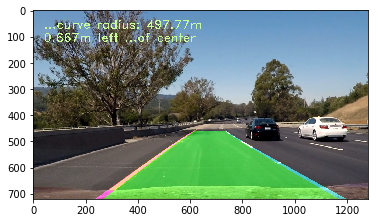

In [32]:
# Testing pipeline and function process_image()

l_line = Line()
r_line = Line()
image_file = 'test_images/test6.jpg'
image_example = cv2.imread(image_file)
image_example = cv2.cvtColor(image_example, cv2.COLOR_BGR2RGB)
# image_example_bin, Minv = pipeline(image_example)
result_pipe = process_image(image_example)
plt.imshow(result_pipe)

In [33]:
l_line = Line()
r_line = Line()

video_output = 'project_output.mp4'
video_input = VideoFileClip('challenge.mp4')
processed_video = video_input.fl_image(process_image)
%time processed_video.write_videofile(video_output, audio = False)

[MoviePy] >>>> Building video project_output.mp4
[MoviePy] Writing video project_output.mp4


100%|██████████| 251/251 [00:27<00:00,  9.07it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_output.mp4 

CPU times: user 42.4 s, sys: 1.54 s, total: 43.9 s
Wall time: 28.2 s
